In [340]:
# !pip install kneed
# !pip install plotly
# !pip install fuzzy-c-means
# !pip install imbalanced-learn

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from kneed import KneeLocator
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
import scipy.cluster.hierarchy as sc
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.cluster import MeanShift
from sklearn.cluster import SpectralClustering
from fcmeans import FCM
from sklearn.metrics import silhouette_score

from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from imblearn.combine import SMOTEENN
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

import warnings
warnings.filterwarnings("ignore")

In [2]:
data = pd.read_csv('data/mental-illnesses.csv')

In [3]:
data.head()

,Entity,Code,Year,Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized,Depressive disorders (share of population) - Sex: Both - Age: Age-standardized,Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized,Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized,Eating disorders (share of population) - Sex: Both - Age: Age-standardized
0,Afghanistan,AFG,1990,0.223206,4.996118,4.713314,0.703023,0.127700
1,Afghanistan,AFG,1991,0.222454,4.989290,4.702100,0.702069,0.123256
2,Afghanistan,AFG,1992,0.221751,4.981346,4.683743,0.700792,0.118844
3,Afghanistan,AFG,1993,0.220987,4.976958,4.673549,0.700087,0.115089
4,Afghanistan,AFG,1994,0.220183,4.977782,4.670810,0.699898,0.111815


In [4]:
data.shape

(6420, 8)

In [5]:
data.isnull().sum()

Entity                                                                                 0
Code                                                                                 270
Year                                                                                   0
Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized      0
Depressive disorders (share of population) - Sex: Both - Age: Age-standardized         0
Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized            0
Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized            0
Eating disorders (share of population) - Sex: Both - Age: Age-standardized             0
dtype: int64

In [6]:
data.duplicated().sum()

0

In [7]:
data.dtypes

Entity                                                                                object
Code                                                                                  object
Year                                                                                   int64
Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized    float64
Depressive disorders (share of population) - Sex: Both - Age: Age-standardized       float64
Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized          float64
Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized          float64
Eating disorders (share of population) - Sex: Both - Age: Age-standardized           float64
dtype: object

In [8]:
data['Entity'].nunique()

214

In [9]:
data['Code'].nunique()

205

In [10]:
data['Year'].nunique()

30

In [11]:
df = data.drop(columns=['Entity', 'Code', 'Year'], axis=1)

In [12]:
df.head()

,Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized,Depressive disorders (share of population) - Sex: Both - Age: Age-standardized,Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized,Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized,Eating disorders (share of population) - Sex: Both - Age: Age-standardized
0,0.223206,4.996118,4.713314,0.703023,0.127700
1,0.222454,4.989290,4.702100,0.702069,0.123256
2,0.221751,4.981346,4.683743,0.700792,0.118844
3,0.220987,4.976958,4.673549,0.700087,0.115089
4,0.220183,4.977782,4.670810,0.699898,0.111815


In [13]:
df.describe()

,Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized,Depressive disorders (share of population) - Sex: Both - Age: Age-standardized,Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized,Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized,Eating disorders (share of population) - Sex: Both - Age: Age-standardized
count,6420.000000,6420.000000,6420.000000,6420.000000,6420.000000
mean,0.266604,3.767036,4.101840,0.636968,0.195664
std,0.039383,0.925286,1.050543,0.233391,0.138380
min,0.188416,1.522333,1.879996,0.181667,0.044780
25%,0.242267,3.080036,3.425846,0.520872,0.096416
50%,0.273477,3.636772,3.939547,0.579331,0.144150
75%,0.286575,4.366252,4.564164,0.844406,0.251167
max,0.462045,7.645899,8.624634,1.506730,1.031688


In [14]:
df.rename(columns={'Schizophrenia disorders (share of population) - Sex: Both - Age: Age-standardized':'Schizophrenia',
                   'Depressive disorders (share of population) - Sex: Both - Age: Age-standardized':'Depressive',
                  'Anxiety disorders (share of population) - Sex: Both - Age: Age-standardized':'Anxiety',
                  'Bipolar disorders (share of population) - Sex: Both - Age: Age-standardized':'Bipolar',
                  'Eating disorders (share of population) - Sex: Both - Age: Age-standardized':'Eating'},
         inplace=True)

In [15]:
df.head()

,Schizophrenia,Depressive,Anxiety,Bipolar,Eating
0,0.223206,4.996118,4.713314,0.703023,0.127700
1,0.222454,4.989290,4.702100,0.702069,0.123256
2,0.221751,4.981346,4.683743,0.700792,0.118844
3,0.220987,4.976958,4.673549,0.700087,0.115089
4,0.220183,4.977782,4.670810,0.699898,0.111815


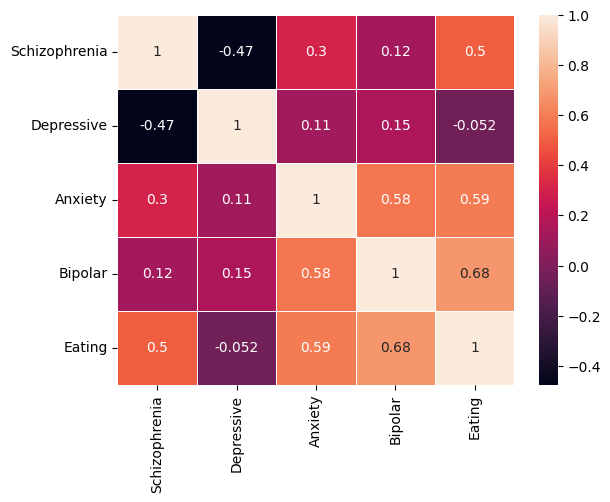

In [16]:
sns.heatmap(df.corr(), annot=True, linewidth=.5)
plt.show()

- There is a correlation between population that have Anxiety, Bipolar and Eating disorders
- Also, a correlation is observed with population who have Schizophrenia and Depressive disorders
- A correlation also exists between population that have Schizophrenia and Eating disorders

In [17]:
df['Anxiety'].unique()

array([4.713314 , 4.7021   , 4.683743 , ..., 3.1884181, 3.172111 ,
       3.1370168])

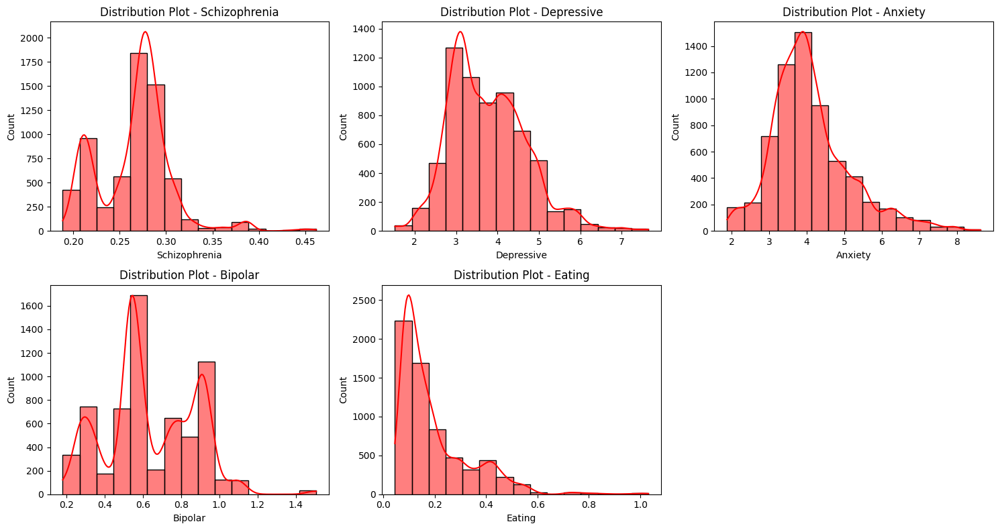

In [18]:
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.flatten()

for i, feature in enumerate(df.columns):
    sns.histplot(df[feature], kde=True, bins=15, color='red', ax=axes[i])
    axes[i].set_title(f'Distribution Plot - {feature}')
    
# Remove any remaining empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

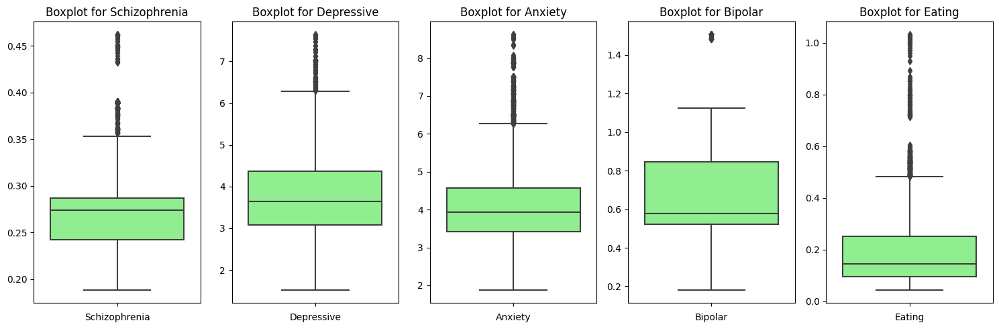

In [19]:
fig, axes = plt.subplots(1, 5, figsize=(15, 5))

for i, feature in enumerate(df.columns):
    sns.boxplot(y=feature, data=df, boxprops={'facecolor': 'lightgreen'}, ax=axes[i]).set(xlabel=feature, ylabel='')
    axes[i].set_title(f'Boxplot for {feature}')

plt.tight_layout()
plt.show()

In [20]:
px.scatter(df, x="Schizophrenia", y="Depressive", color="Anxiety", marginal_y="box",
           marginal_x="box", trendline="ols", template="none")

- The share of population that suffer from Schizophrenia (majority lie between 0.18 to 0.35) and Depressive disorders (majority lie between 1.5 to 4.3) can be seen
- The share of population suffering from Schizophrenia are less when the share of population suffering from Depressive disorder are more. A negative trend can be observed
- The share of population that suffer from Anxiety is mostly from 2 to 5

In [21]:
px.scatter(df, x="Depressive", y="Anxiety", color="Bipolar", marginal_y="box",
           marginal_x="box", trendline="ols", template="none")

- The share of population that suffer from Depressive (majority lie between 1.5 to 6.2) and Anxiery disorders (majority lie between 1.8 to 4.5) can be seen
- Even if the share of population having Depressive disorder increases, there is very little change in the share of population having Anxiety disorder
- The share of population that suffer from Bipolar disorder mostly range from 0.7 to 1.2

In [22]:
px.scatter(df, x="Anxiety", y="Bipolar", color="Eating", marginal_y="box",
           marginal_x="box", trendline="ols", template="none")

- The share of population that suffer from Anxiety (majority lie between 1.8 to 6.2) and Bipolar disorders (majority lie between 0.18 to 1.1) can be seen
- A linear trend can be observed among the share of population having Anxiety and Bipolar disorder.
- Most of the population that suffer both of these disorders have very less number of people suffering from Eating disorder

In [23]:
px.scatter(df, x="Bipolar", y="Eating", color="Schizophrenia", marginal_y="box",
           marginal_x="box", trendline="ols", template="none")

- The share of population that suffer from Bipolar (majority lie between 0.18 to 1.1) and Eating (majority lie between 0.04 to 0.4) can be seen
- A near to linear trend can be observed among the share of population having Bipolar and Eating disorders
- The share of population that suffer from Schizophrenia lie between 0.26 to 0.3

In [24]:
px.scatter_matrix(df, dimensions=["Schizophrenia", "Depressive", "Anxiety", "Bipolar"], color="Eating")

- The correlation between each type of disorders can be observed here

In [25]:
def plot_clusters(clusters):
    
    plt.figure(figsize=(6, 6))
    sns.scatterplot(data=df, x='Schizophrenia', y='Depressive', hue=clusters,
                    palette=sns.color_palette("viridis", as_cmap=True))
    plt.show()


    plt.figure(figsize=(6, 6))
    sns.scatterplot(data=df, x='Depressive', y='Anxiety', hue=clusters,
                    palette=sns.color_palette("viridis", as_cmap=True))
    plt.show()


    plt.figure(figsize=(6, 6))
    sns.scatterplot(data=df, x='Anxiety', y='Bipolar', hue=clusters,
                    palette=sns.color_palette("viridis", as_cmap=True))
    plt.show()    


    plt.figure(figsize=(6, 6))
    sns.scatterplot(data=df, x='Bipolar', y='Eating', hue=clusters,
                    palette=sns.color_palette("viridis", as_cmap=True))
    plt.show()


    plt.figure(figsize=(6, 6))
    sns.scatterplot(data=df, x='Eating', y='Schizophrenia', hue=clusters,
                    palette=sns.color_palette("viridis", as_cmap=True))
    plt.show()

## K-means Clustering

In [26]:
# ---> Elbow Method to select the 'k' value
# Within-Cluster Sum of Squares
wcss = []

for k in range(1,11):
    kmeans = KMeans(n_clusters=k, init='k-means++')
    kmeans.fit(df)
    wcss.append(kmeans.inertia_)

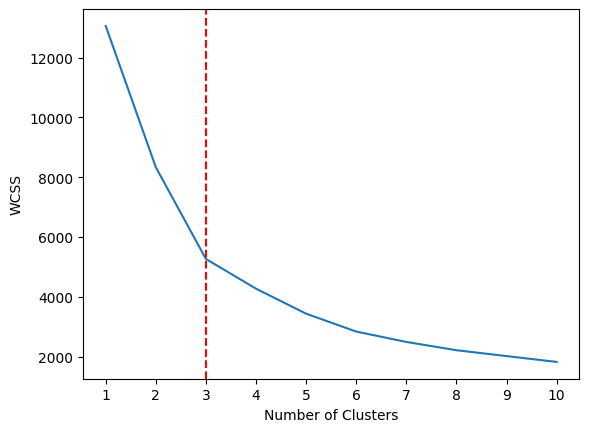

In [27]:
# Plotting elbow curve
plt.plot(range(1,11), wcss)
plt.xticks(range(1,11))
plt.xlabel("Number of Clusters")
plt.ylabel("WCSS")
plt.axvline(x = 3, color = 'r', label = 'axvline - full height', linestyle="dashed")
plt.show()

In [28]:
# Find elbow by kneed
kl = KneeLocator(range(1,11), wcss, curve='convex', direction='decreasing')
# Curve='convex' when WCSS values decrease, and 'concave' when WCSS values increase

In [29]:
kl.elbow

3

In [30]:
# From the elbow curve, we choose 'k=3'
kmeans = KMeans(n_clusters=3, init='k-means++')
kmeans.fit(df)

KMeans(n_clusters=3)

In [31]:
np.unique(kmeans.labels_, return_counts=True)

(array([0, 1, 2]), array([1175, 3040, 2205], dtype=int64))

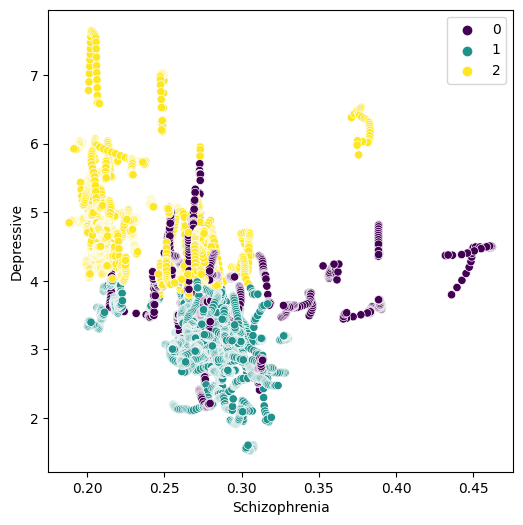

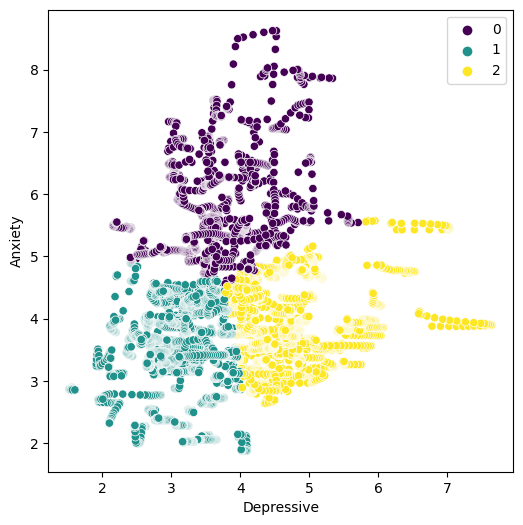

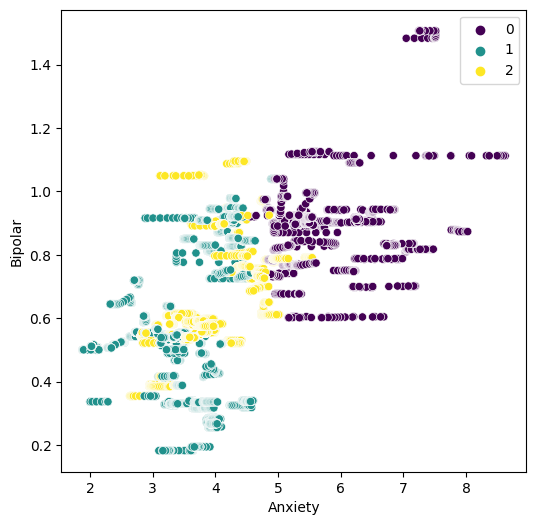

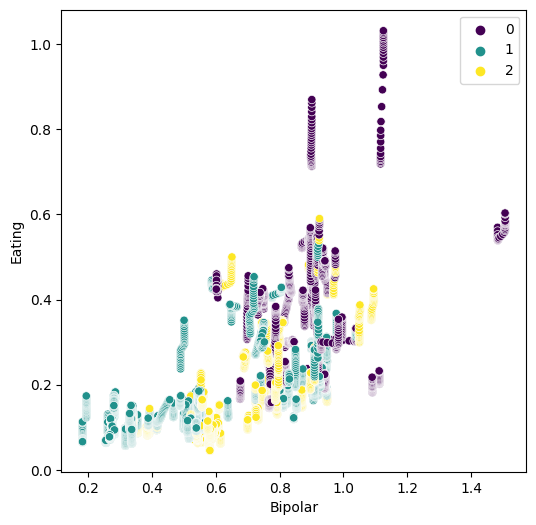

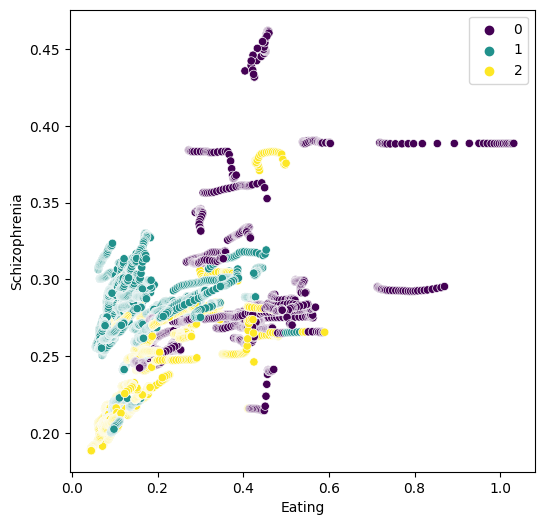

In [32]:
plot_clusters(kmeans.labels_)

In [33]:
print(f"Silhouette Score: {silhouette_score(df, kmeans.labels_)}")

Silhouette Score: 0.4004021662265268


##### Silhouette Score

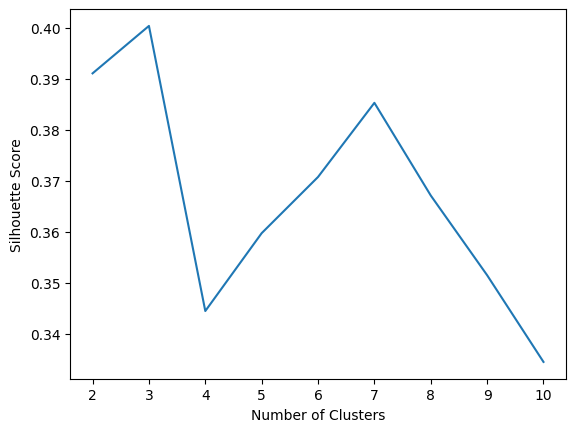

In [50]:
silhouette_coefficients = []

for k in range(2,11):
    clustering = KMeans(n_clusters=k, init='k-means++')
    clustering.fit(df)
    score = silhouette_score(df, clustering.labels_)
    silhouette_coefficients.append(score)
    
# Plotting Silhouette Score

plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.show()

# Silhouette Score ranges between -1 to +1
# Value more towards +1 more better clustering is

## Mini Batch K-means Clustering

In [34]:
mbkmeans = MiniBatchKMeans(n_clusters=3, random_state=0, batch_size=6)
mbkmeans.fit(df)

MiniBatchKMeans(batch_size=6, n_clusters=3, random_state=0)

In [35]:
np.unique(mbkmeans.labels_, return_counts=True)

(array([0, 1, 2]), array([2130, 2577, 1713], dtype=int64))

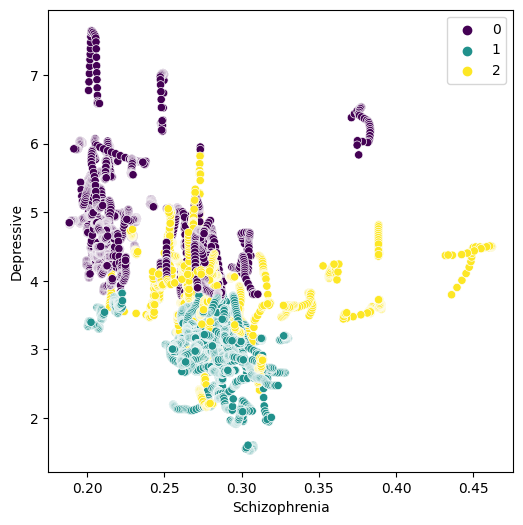

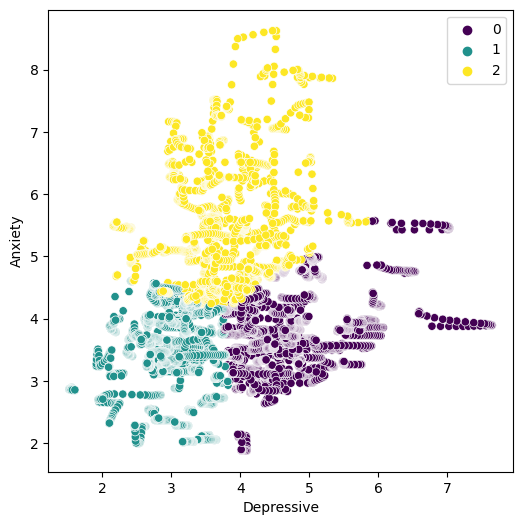

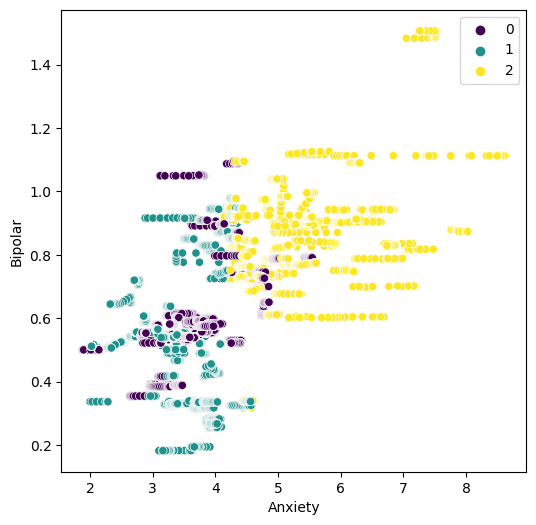

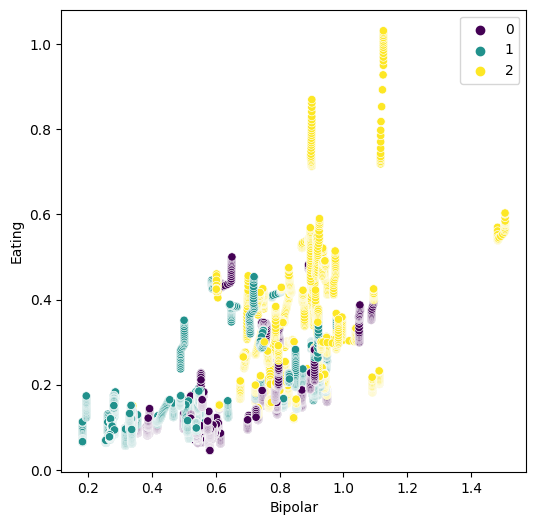

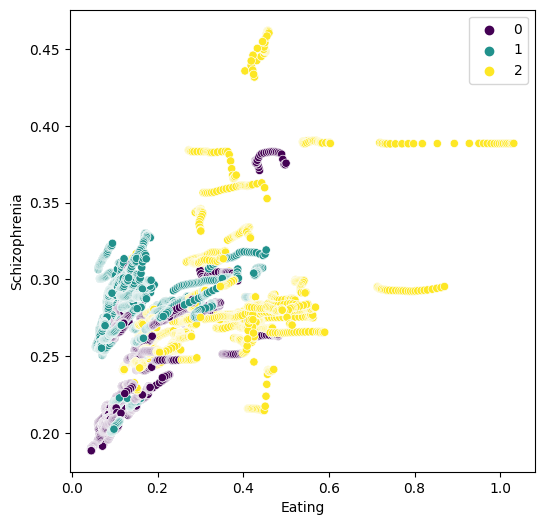

In [36]:
plot_clusters(mbkmeans.labels_)

In [37]:
print(f"Silhouette Score: {silhouette_score(df, mbkmeans.labels_)}")

Silhouette Score: 0.38464492188079275


##### Silhouette Score

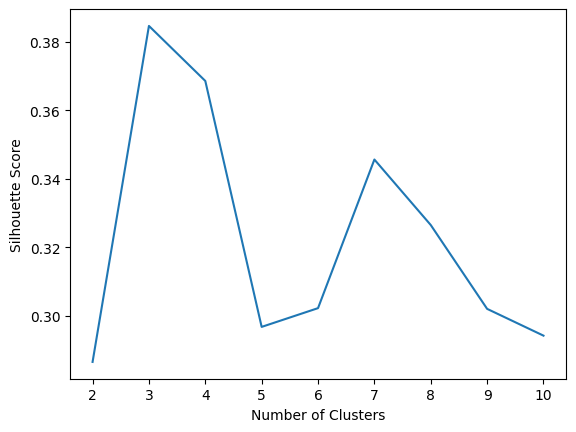

In [36]:
silhouette_coefficients = []

for k in range(2,11):
    clustering = MiniBatchKMeans(n_clusters=k, random_state=0, batch_size=6)
    clustering.fit(df)
    score = silhouette_score(df, clustering.labels_)
    silhouette_coefficients.append(score)

# Plotting Silhouette Score

plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.show()

# Silhouette Score ranges between -1 to +1
# Value more towards +1 more better clustering is

## Agglomerative Clustering

In [38]:
scaler = StandardScaler()
scaled_df = scaler.fit_transform(df)

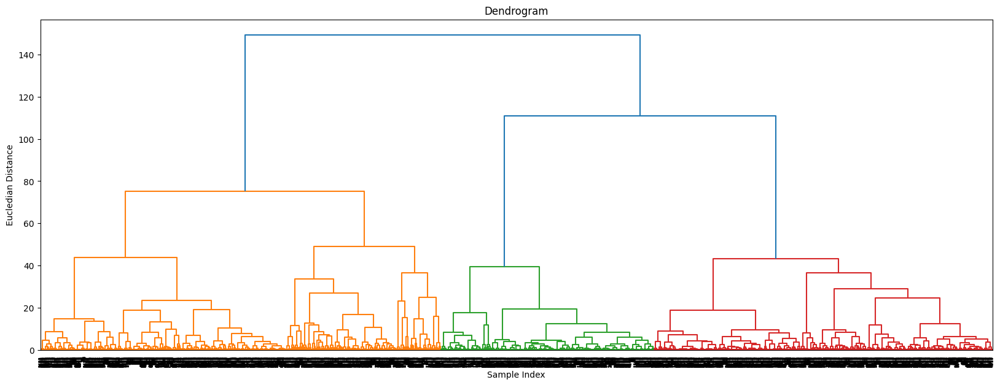

In [55]:
# Plot the Dendrogram
plt.figure(figsize=(20,7))
plt.title("Dendograms")

# Create Dendogram
sc.dendrogram(sc.linkage(scaled_df, method='ward')) # Linkage algo. determines how the distance between clusters is calculated
plt.title("Dendrogram")
plt.xlabel('Sample Index')
plt.ylabel('Eucledian Distance')
plt.show()

In [39]:
agglomerative = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
agglomerative.fit(scaled_df)

AgglomerativeClustering(n_clusters=3)

In [40]:
np.unique(agglomerative.labels_, return_counts=True)

(array([0, 1, 2], dtype=int64), array([2700, 2280, 1440], dtype=int64))

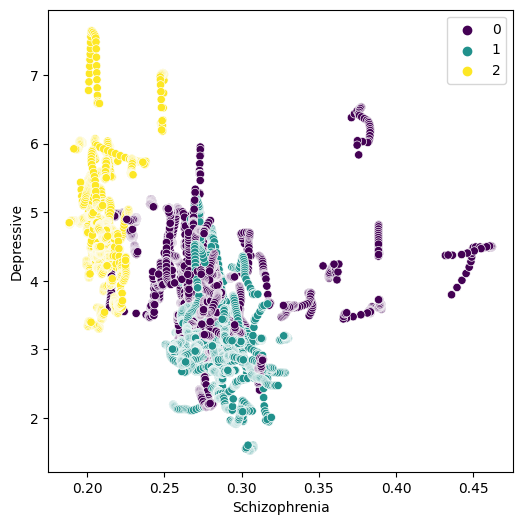

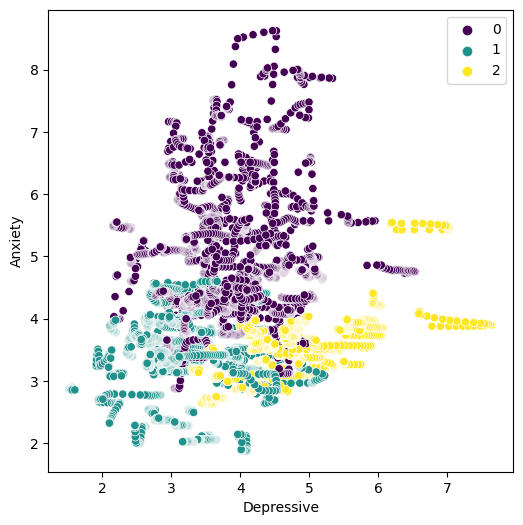

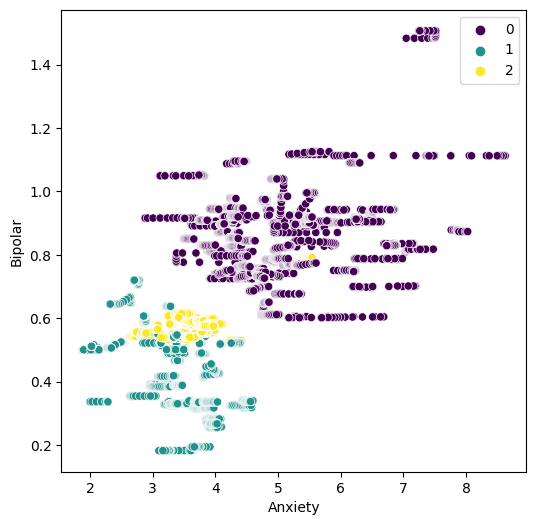

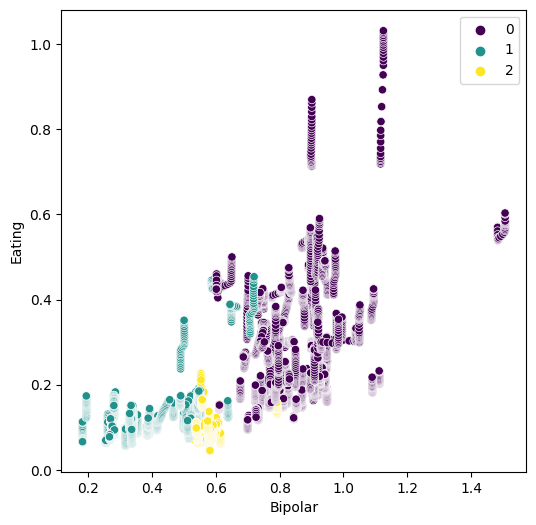

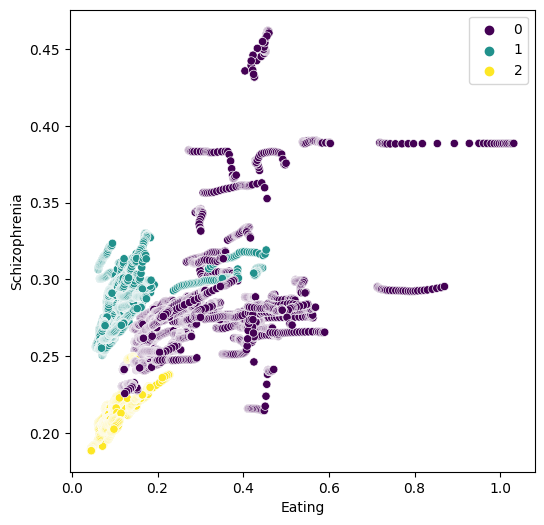

In [41]:
plot_clusters(agglomerative.labels_)

In [42]:
print(f"Silhouette Score: {silhouette_score(scaled_df, agglomerative.labels_)}")

Silhouette Score: 0.3873235745784638


##### Silhouette Score

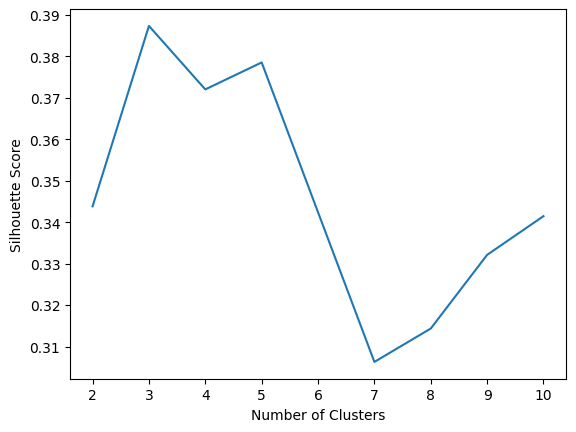

In [246]:
silhouette_coefficients = []

for k in range(2,11):
    clustering = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward')
    clustering.fit(scaled_df)
    score = silhouette_score(scaled_df, clustering.labels_)
    silhouette_coefficients.append(score)

# Plotting Silhouette Score

plt.plot(range(2,11), silhouette_coefficients)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.show()

## DBSCAN Clustering

In [43]:
dbscan = DBSCAN(eps = 0.55, min_samples = 4)
dbscan.fit(df)

DBSCAN(eps=0.55, min_samples=4)

In [44]:
np.unique(dbscan.labels_, return_counts=True)

(array([0, 1, 2], dtype=int64), array([6360,   30,   30], dtype=int64))

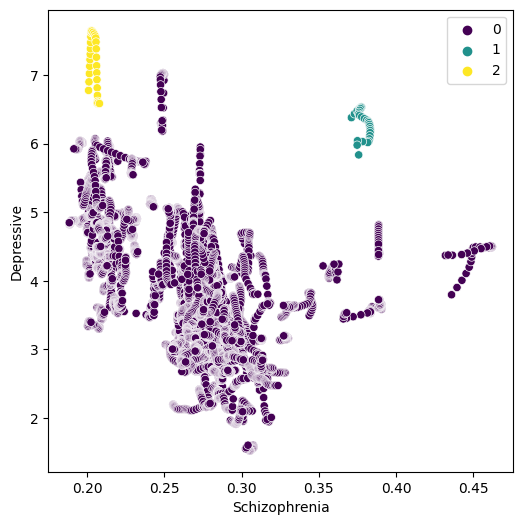

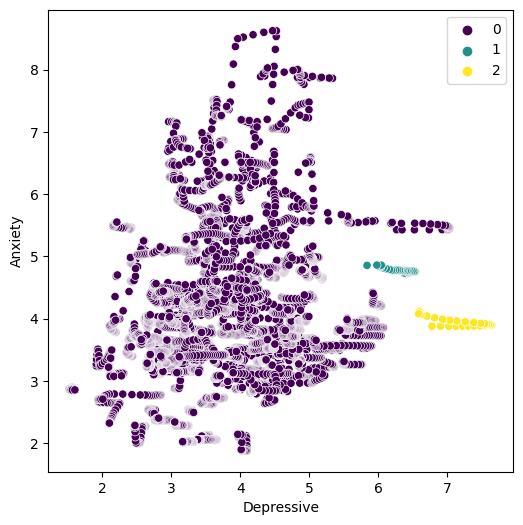

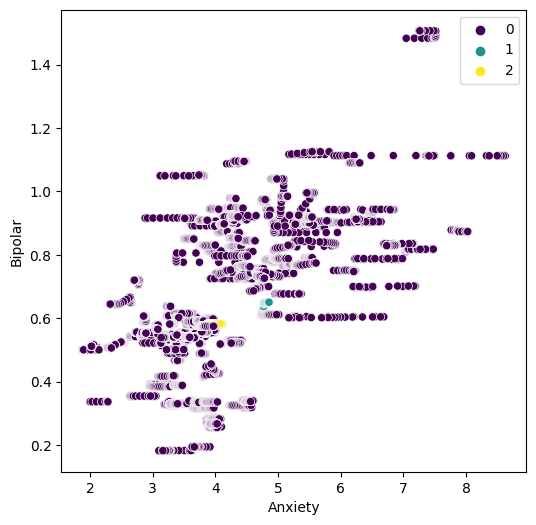

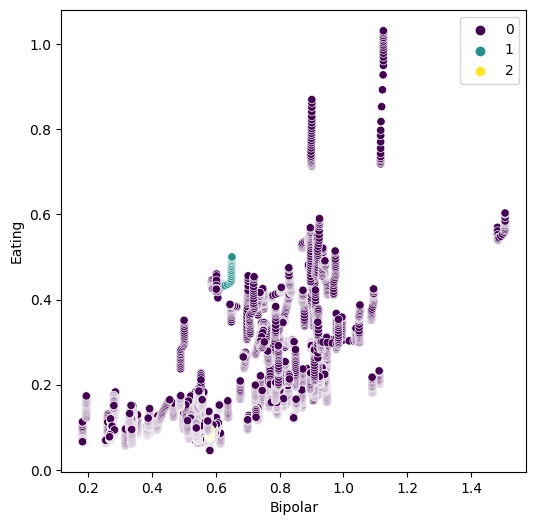

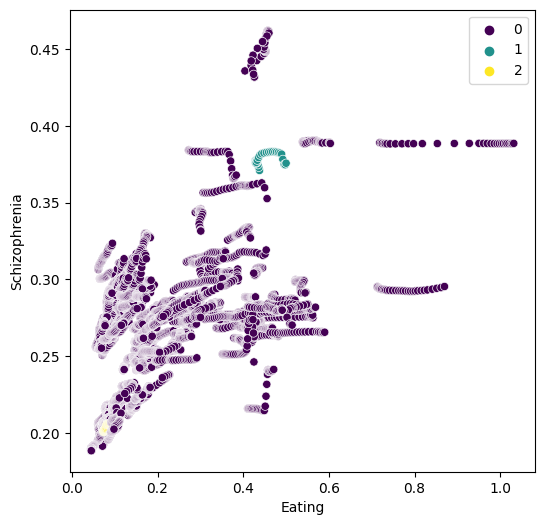

In [45]:
plot_clusters(dbscan.labels_)

In [46]:
print(f"Silhouette Score: {silhouette_score(df, dbscan.labels_)}")

Silhouette Score: 0.35464698854921717


##### Silhouette Score

In [77]:
silhouette_coefficients = []
epsilon = [0.5, 0.55, 0.6]
min_samples = [4,5,6]##### Silhouette Score
hyper_params = [f"eps:{e}, min_spl:{m}" for e in epsilon for m in min_samples]
hyper_params

['eps:0.5, min_spl:4',
 'eps:0.5, min_spl:5',
 'eps:0.5, min_spl:6',
 'eps:0.55, min_spl:4',
 'eps:0.55, min_spl:5',
 'eps:0.55, min_spl:6',
 'eps:0.6, min_spl:4',
 'eps:0.6, min_spl:5',
 'eps:0.6, min_spl:6']

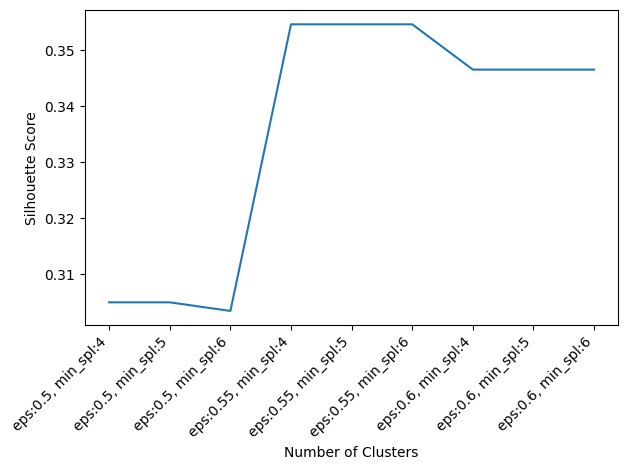

In [80]:
silhouette_coefficients = []
epsilon = [0.5, 0.55, 0.6]
min_samples = [4,5,6]
hyper_params = [f"eps:{eps}, min_spl:{min_spl}" for eps in epsilon for min_spl in min_samples]

for eps in epsilon:
    for min_spl in min_samples:
        clustering = DBSCAN(eps = eps, min_samples = min_spl)
        clustering.fit(df)
        score = silhouette_score(df, clustering.labels_)
        silhouette_coefficients.append(score)

# Plotting Silhouette Score

plt.plot(hyper_params, silhouette_coefficients)
plt.xticks(rotation=45, ha="right")
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.tight_layout()
plt.show()

## Mean Shift Clustering

In [47]:
mean_shift = MeanShift(bandwidth=0.6)
mean_shift.fit(df)

MeanShift(bandwidth=0.6)

In [48]:
np.unique(mean_shift.labels_, return_counts=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18], dtype=int64),
 array([1593, 1000,  799,  495,  398,  403,  377,  260,  268,  134,  115,
         166,   84,  134,   73,   47,   24,   30,   20], dtype=int64))

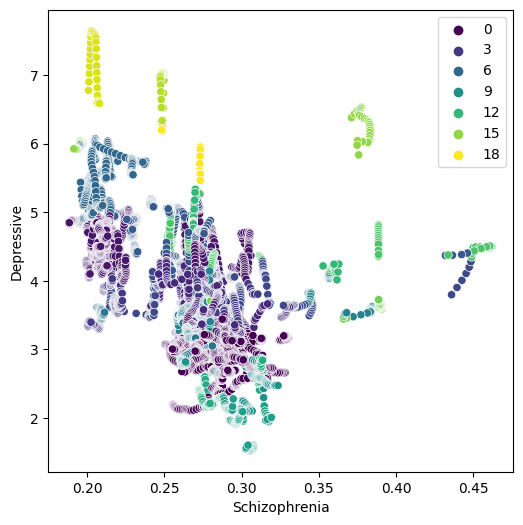

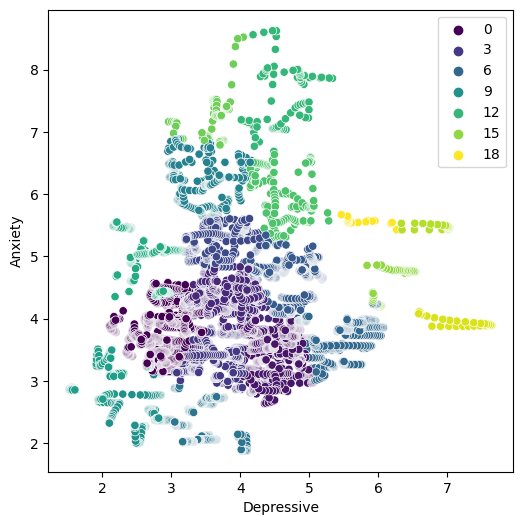

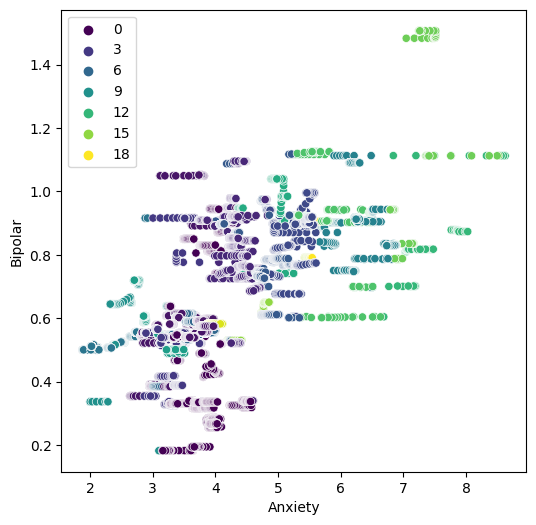

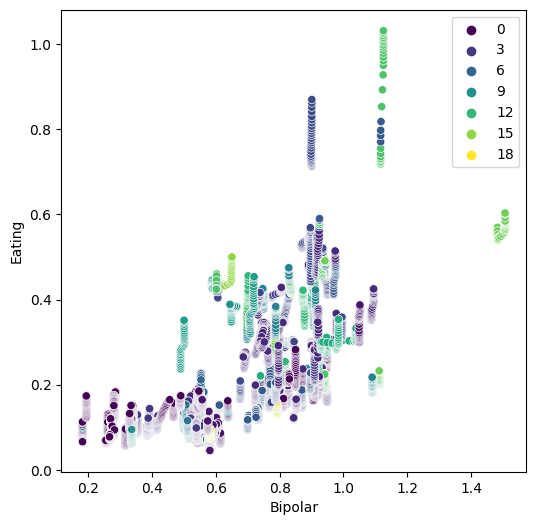

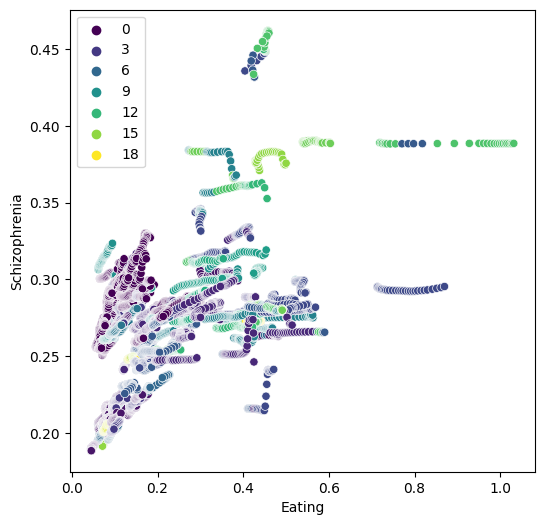

In [49]:
plot_clusters(mean_shift.labels_)

In [50]:
print(f"Silhouette Score: {silhouette_score(df, mean_shift.labels_)}")

Silhouette Score: 0.34559717222147035


##### Silhouette Score

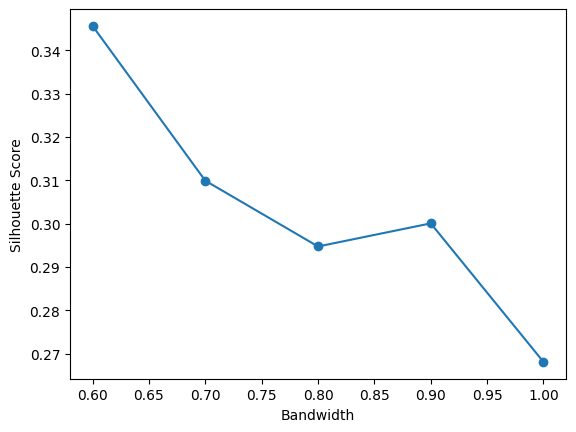

In [93]:
silhouette_scores = []
bandwidth_values = np.arange(0.2, 1.01, 0.1)

for bandwidth in bandwidth_values:
    clustering = MeanShift(bandwidth=bandwidth)
    clustering.fit(df)
    score = silhouette_score(df, clustering.labels_)
    silhouette_scores.append(score)

# Plotting the silhouette scores
plt.plot(bandwidth_values, silhouette_scores, marker='o')
plt.xlabel('Bandwidth')
plt.ylabel('Silhouette Score')
plt.show()

## Spectral Clustering

In [51]:
spectral = SpectralClustering(n_clusters=2, assign_labels='discretize')
spectral.fit(df)

SpectralClustering(assign_labels='discretize', n_clusters=2)

In [52]:
np.unique(spectral.labels_, return_counts=True)

(array([0, 1], dtype=int64), array([5912,  508], dtype=int64))

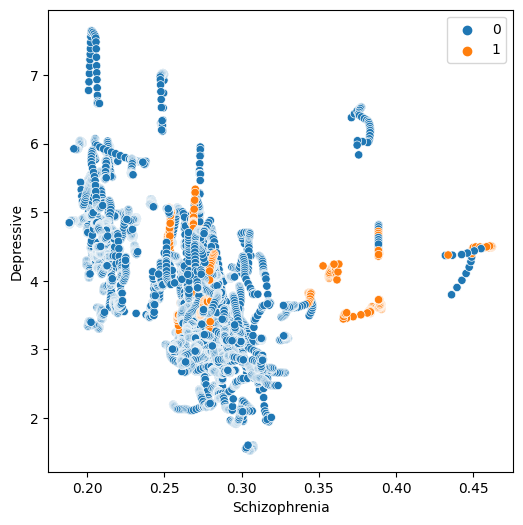

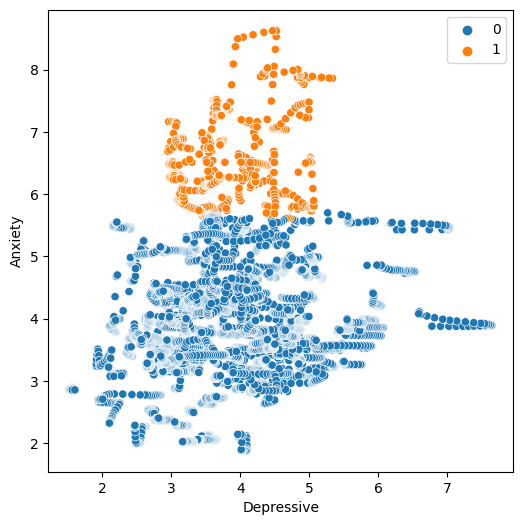

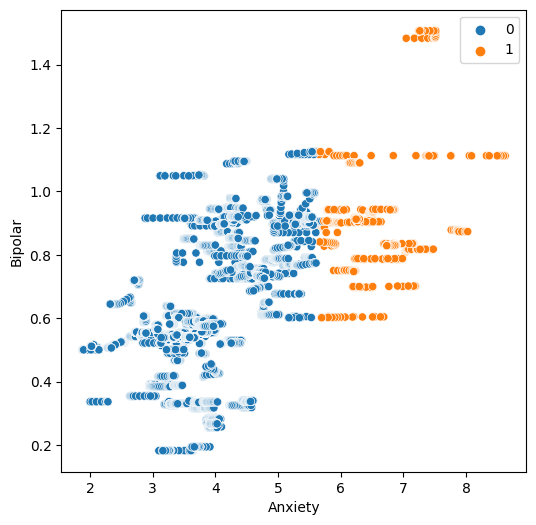

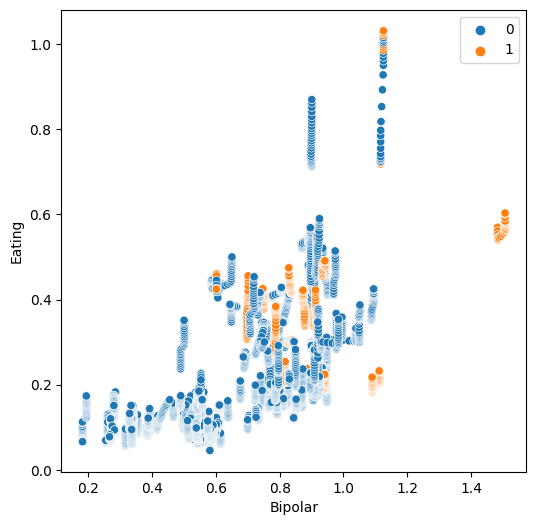

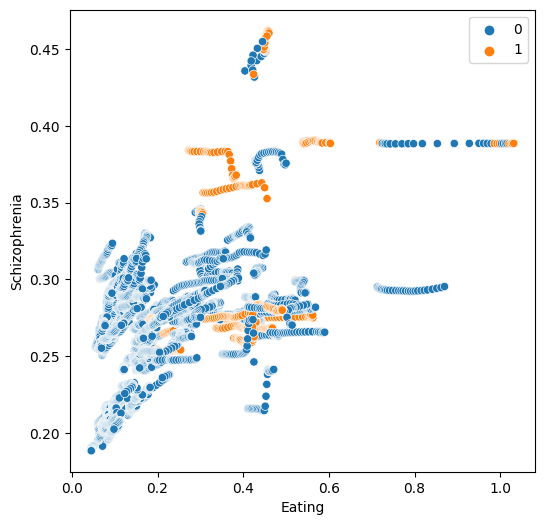

In [53]:
clusters = spectral.labels_

plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x='Schizophrenia', y='Depressive', hue=clusters)
plt.show()


plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x='Depressive', y='Anxiety', hue=clusters)
plt.show()


plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x='Anxiety', y='Bipolar', hue=clusters)
plt.show()    


plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x='Bipolar', y='Eating', hue=clusters)
plt.show()


plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x='Eating', y='Schizophrenia', hue=clusters)
plt.show()

In [54]:
print(f"Silhouette Score: {silhouette_score(df, spectral.labels_)}")

Silhouette Score: 0.45004975135153524


##### Silhouette Score

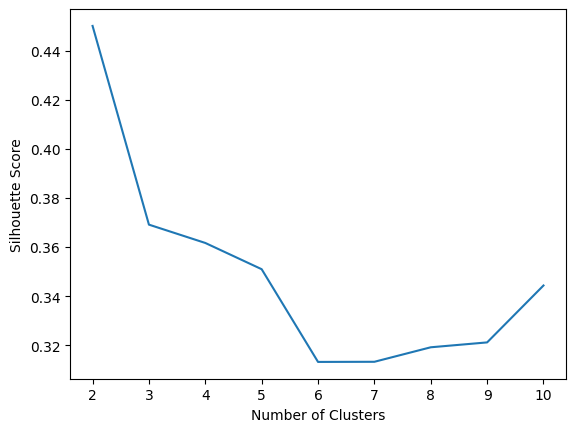

In [52]:
silhouette_coefficients = []

for k in range(2,11):
    clustering = SpectralClustering(n_clusters=k, assign_labels='discretize')
    clustering.fit(df)
    score = silhouette_score(df, clustering.labels_)
    silhouette_coefficients.append(score)

# Plotting Silhouette Score

plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.show()

# Silhouette Score ranges between -1 to +1
# Value more towards +1 more better clustering is

## Fuzzy c-means Clustering

In [55]:
scaler = StandardScaler()
scaled_df = scaler.fit_transform(df)

In [56]:
for i in range(2,11):
    fcmeans = FCM(n_clusters=i)
    fcmeans.fit(scaled_df)
    print(i, fcmeans.partition_coefficient)

2 0.32942198054396077
3 0.20256943822673157
4 0.13721322205845357
5 0.09618200016525146
6 0.07562973664290826
7 0.06024745073859111
8 0.04969656435492686
9 0.042372791604654174
10 0.036737042883051046


In [57]:
# partition_coefficient indicates how well-separated the clusters are from each other
# higher partition coefficient indicates better separation between clusters
# thus, we choose n_clusters=2 as it gives us the highest partition coefficient among all

fcmeans = FCM(n_clusters=2)
fcmeans.fit(scaled_df)

In [58]:
fcm_labels = fcmeans.predict(scaled_df)

In [59]:
np.unique(fcm_labels, return_counts=True)

(array([0, 1], dtype=int64), array([3764, 2656], dtype=int64))

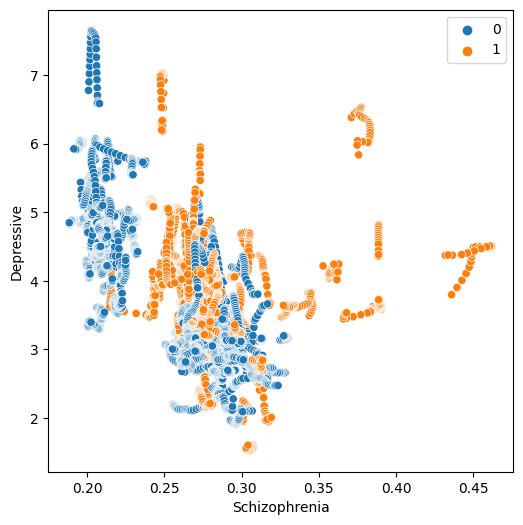

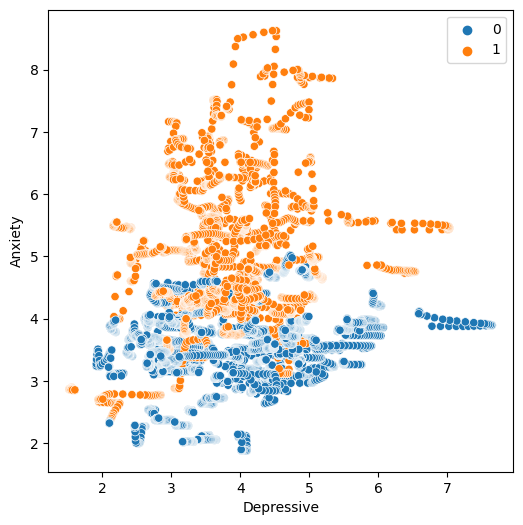

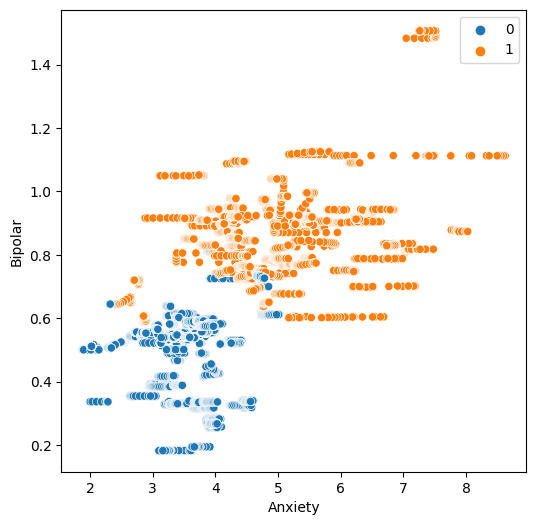

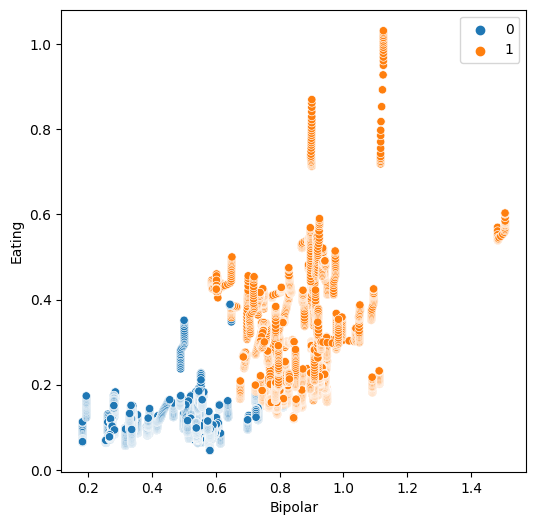

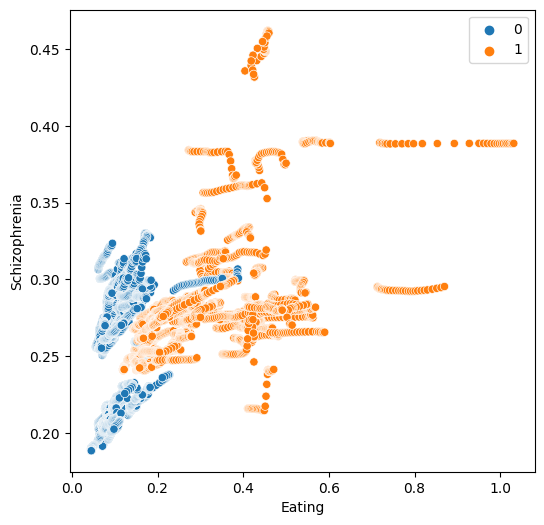

In [60]:
clusters = fcm_labels

plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x='Schizophrenia', y='Depressive', hue=clusters)
plt.show()


plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x='Depressive', y='Anxiety', hue=clusters)
plt.show()


plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x='Anxiety', y='Bipolar', hue=clusters)
plt.show()    


plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x='Bipolar', y='Eating', hue=clusters)
plt.show()


plt.figure(figsize=(6, 6))
sns.scatterplot(data=df, x='Eating', y='Schizophrenia', hue=clusters)
plt.show()

In [61]:
print(f"Silhouette Score: {silhouette_score(scaled_df, fcm_labels)}")

Silhouette Score: 0.35217848440245064


##### Silhouette Score

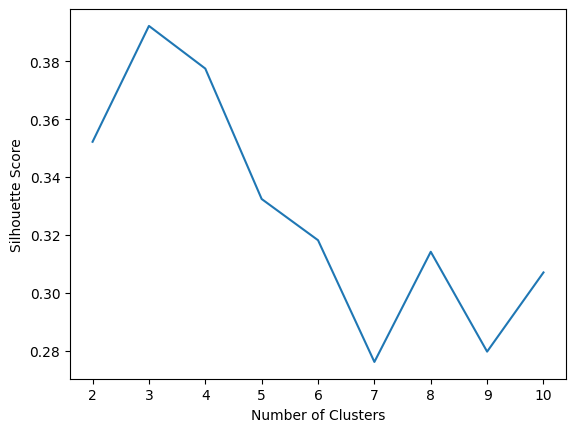

In [58]:
silhouette_coefficients = []

for k in range(2,11):
    clustering = FCM(n_clusters=k)
    clustering.fit(scaled_df)
    clustering_labels = clustering.predict(scaled_df)
    score = silhouette_score(scaled_df, clustering_labels)
    silhouette_coefficients.append(score)
    
# Plotting Silhouette Score

plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.show()

# Silhouette Score ranges between -1 to +1
# Value more towards +1 more better clustering is

## PCA to reduce dimensions of data

In [62]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)

# Fit and transform the data
pca_data = pca.fit_transform(df)
pca_data = pd.DataFrame(data=pca_data, columns=["PCA1", "PCA2"])

In [63]:
pca_data.head()

,PCA1,PCA2
0,0.989684,0.951139
1,0.976506,0.948749
2,0.956275,0.947727
3,0.944956,0.947250
4,0.942434,0.949121


In [64]:
def plot_clusters_PCA(clusters):
    
    plt.figure(figsize=(6, 6))
    sns.scatterplot(data=pca_data, x='PCA1', y='PCA2', hue=clusters,
                    palette=sns.color_palette("viridis", as_cmap=True))
    plt.show()

## PCA: K-means Clustering

In [65]:
# ---> Elbow Method to select the 'k' value
# Within-Cluster Sum of Squares
wcss = []

for k in range(1,11):
    kmeans = KMeans(n_clusters=k, init='k-means++')
    kmeans.fit(pca_data)
    wcss.append(kmeans.inertia_)

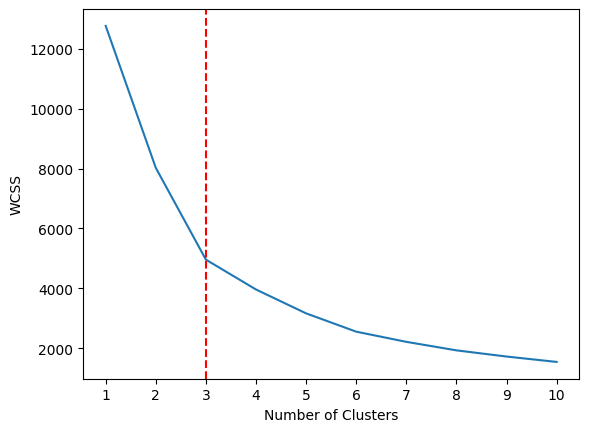

In [66]:
# Plotting elbow curve
plt.plot(range(1,11), wcss)
plt.xticks(range(1,11))
plt.xlabel("Number of Clusters")
plt.ylabel("WCSS")
plt.axvline(x = 3, color = 'r', label = 'axvline - full height', linestyle="dashed")
plt.show()

In [67]:
# Find elbow by kneed
kl = KneeLocator(range(1,11), wcss, curve='convex', direction='decreasing')
# Curve='convex' when WCSS values decrease, and 'concave' when WCSS values increase

In [68]:
kl.elbow

3

In [69]:
# From the elbow curve, we choose 'k=3'
kmeans = KMeans(n_clusters=3, init='k-means++')
kmeans.fit(pca_data)

KMeans(n_clusters=3)

In [70]:
np.unique(kmeans.labels_, return_counts=True)

(array([0, 1, 2]), array([1168, 2218, 3034], dtype=int64))

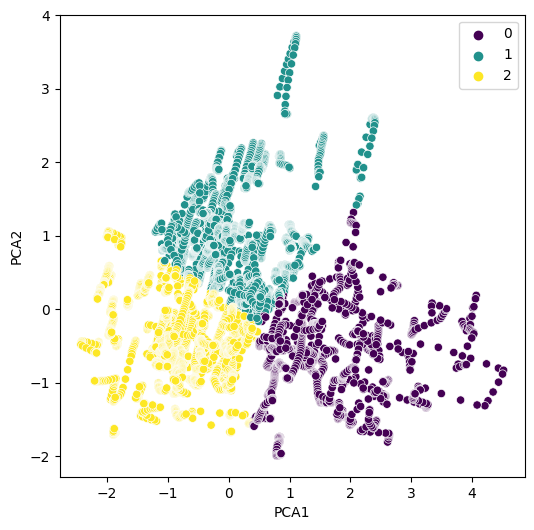

In [71]:
plot_clusters_PCA(kmeans.labels_)

In [276]:
print(f"Silhouette Score: {silhouette_score(pca_data, kmeans.labels_)}")

Silhouette Score: 0.420164211327286


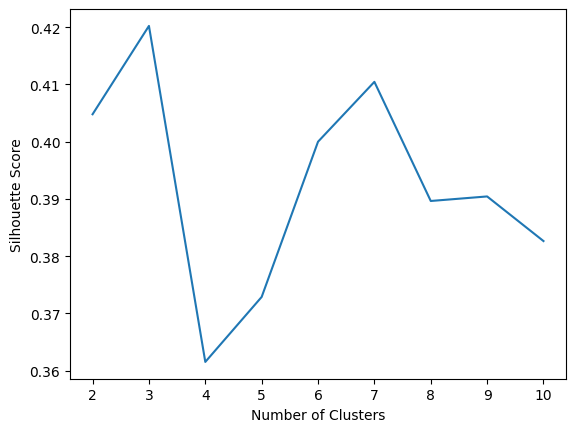

In [166]:
silhouette_coefficients = []

for k in range(2,11):
    clustering = KMeans(n_clusters=k, init='k-means++')
    clustering.fit(pca_data)
    score = silhouette_score(pca_data, clustering.labels_)
    silhouette_coefficients.append(score)
    
# Plotting Silhouette Score

plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.show()

# Silhouette Score ranges between -1 to +1
# Value more towards +1 more better clustering is

## PCA: Mini Batch K-means Clustering

In [72]:
mbkmeans = MiniBatchKMeans(n_clusters=3, random_state=0, batch_size=6)
mbkmeans.fit(pca_data)

MiniBatchKMeans(batch_size=6, n_clusters=3, random_state=0)

In [73]:
np.unique(mbkmeans.labels_, return_counts=True)

(array([0, 1, 2]), array([2129, 1707, 2584], dtype=int64))

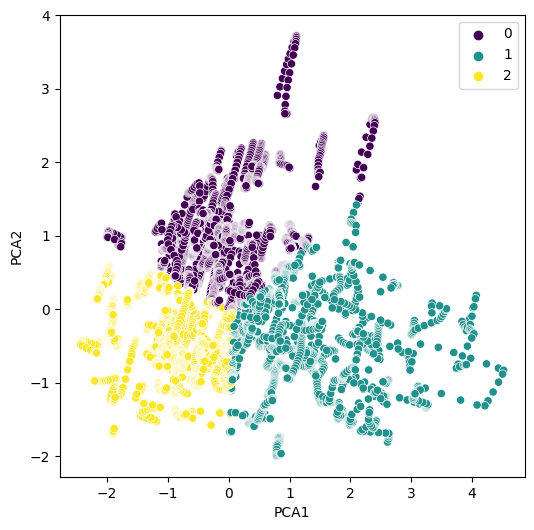

In [74]:
plot_clusters_PCA(mbkmeans.labels_)

In [75]:
print(f"Silhouette Score: {silhouette_score(pca_data, mbkmeans.labels_)}")

Silhouette Score: 0.4031547448922411


##### Silhouette Score

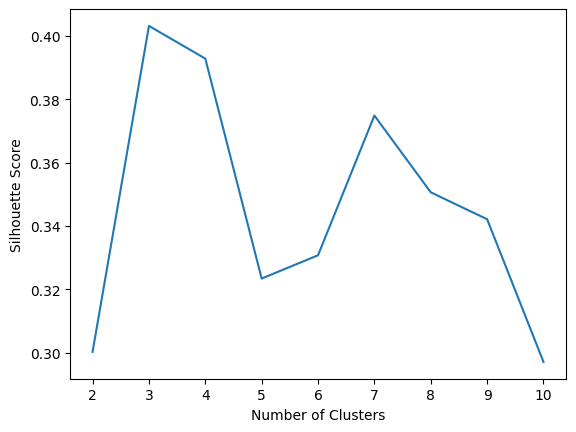

In [170]:
silhouette_coefficients = []

for k in range(2,11):
    clustering = MiniBatchKMeans(n_clusters=k, random_state=0, batch_size=6)
    clustering.fit(pca_data)
    score = silhouette_score(pca_data, clustering.labels_)
    silhouette_coefficients.append(score)

# Plotting Silhouette Score

plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.show()

# Silhouette Score ranges between -1 to +1
# Value more towards +1 more better clustering is

## PCA: Agglomerative Clustering

In [178]:
# scaler_pca = StandardScaler()
# scaled_df_pca = scaler_pca.fit_transform(pca_data)

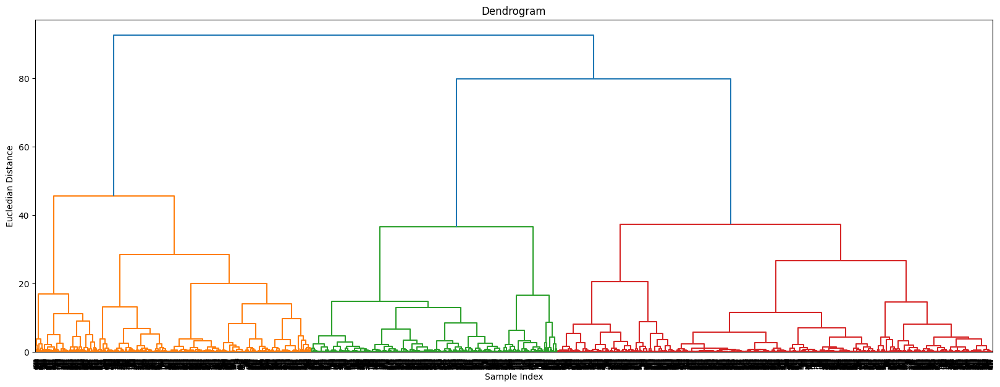

In [111]:
# Plot the Dendrogram
plt.figure(figsize=(20,7))
plt.title("Dendograms")

# Create Dendogram
sc.dendrogram(sc.linkage(pca_data, method='ward')) # Linkage algo. determines how the distance between clusters is calculated
plt.title("Dendrogram")
plt.xlabel('Sample Index')
plt.ylabel('Eucledian Distance')
plt.show()

In [76]:
agglomerative = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
agglomerative.fit(pca_data)

AgglomerativeClustering(n_clusters=3)

In [77]:
np.unique(agglomerative.labels_, return_counts=True)

(array([0, 1, 2], dtype=int64), array([1854, 2919, 1647], dtype=int64))

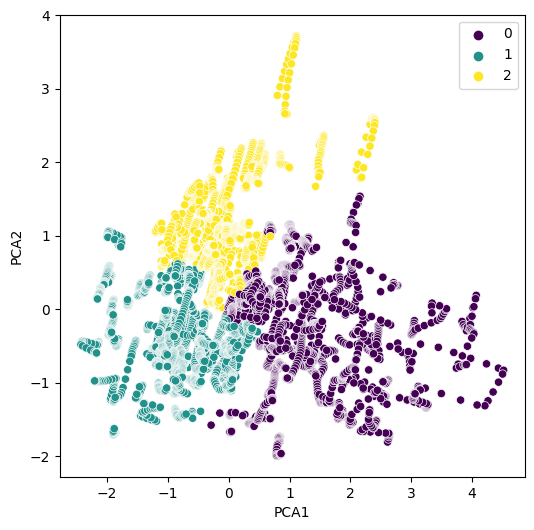

In [78]:
plot_clusters_PCA(agglomerative.labels_)

In [79]:
print(f"Silhouette Score: {silhouette_score(pca_data, agglomerative.labels_)}")

Silhouette Score: 0.3999500566544753


##### Silhouette Score

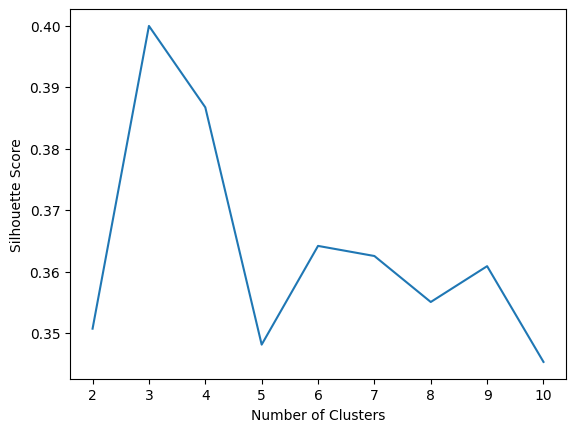

In [182]:
##### Silhouette Score
silhouette_coefficients = []


for k in range(2,11):
    clustering = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward')
    clustering.fit(pca_data)
    score = silhouette_score(pca_data, clustering.labels_)
    silhouette_coefficients.append(score)

# Plotting Silhouette Score

plt.plot(range(2,11), silhouette_coefficients)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.show()

## PCA: DBSCAN Clustering PCA

In [80]:
dbscan = DBSCAN(eps = 0.5, min_samples = 5)
dbscan.fit(pca_data)

DBSCAN()

In [81]:
np.unique(dbscan.labels_, return_counts=True)

(array([0, 1], dtype=int64), array([6390,   30], dtype=int64))

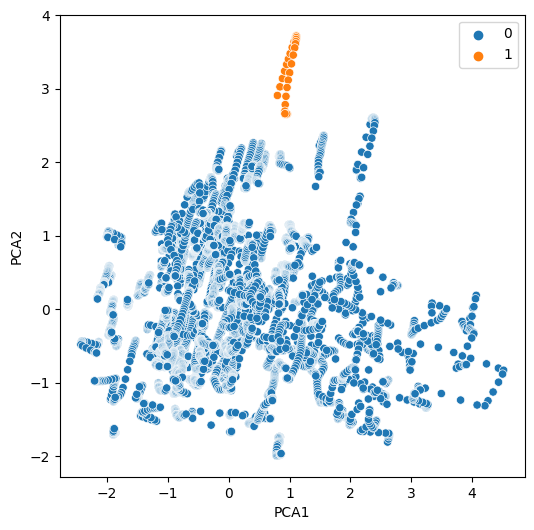

In [82]:
clusters = dbscan.labels_

plt.figure(figsize=(6, 6))
sns.scatterplot(data=pca_data, x='PCA1', y='PCA2', hue=clusters)
plt.show()

In [83]:
print(f"Silhouette Score: {silhouette_score(pca_data, dbscan.labels_)}")

Silhouette Score: 0.48365628021466317


##### Silhouette Score

In [84]:
silhouette_coefficients = []
epsilon = [0.5, 0.55, 0.6]
min_samples = [4,5,6]
hyper_params = [f"eps:{e}, min_spl:{m}" for e in epsilon for m in min_samples]
hyper_params

['eps:0.5, min_spl:4',
 'eps:0.5, min_spl:5',
 'eps:0.5, min_spl:6',
 'eps:0.55, min_spl:4',
 'eps:0.55, min_spl:5',
 'eps:0.55, min_spl:6',
 'eps:0.6, min_spl:4',
 'eps:0.6, min_spl:5',
 'eps:0.6, min_spl:6']

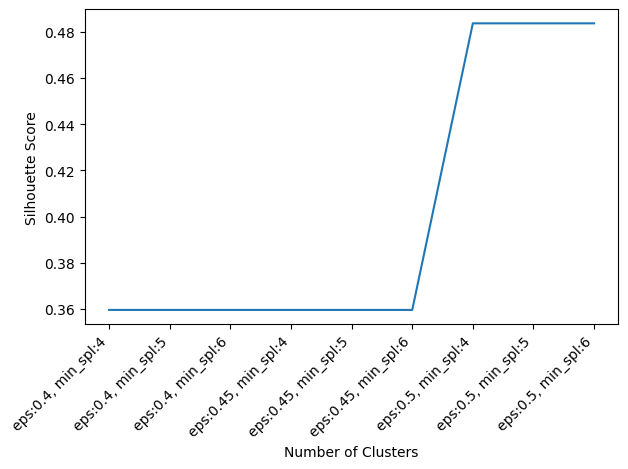

In [192]:
silhouette_coefficients = []
epsilon = [0.4, 0.45, 0.5]
min_samples = [4,5,6]
hyper_params = [f"eps:{eps}, min_spl:{min_spl}" for eps in epsilon for min_spl in min_samples]

for eps in epsilon:
    for min_spl in min_samples:
        clustering = DBSCAN(eps = eps, min_samples = min_spl)
        clustering.fit(pca_data)
        score = silhouette_score(pca_data, clustering.labels_)
        silhouette_coefficients.append(score)

# Plotting Silhouette Score

plt.plot(hyper_params, silhouette_coefficients)
plt.xticks(rotation=45, ha="right")
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.tight_layout()
plt.show()

## PCA: Mean Shift Clustering

In [85]:
mean_shift = MeanShift(bandwidth=0.2)
mean_shift.fit(pca_data)

MeanShift(bandwidth=0.2)

In [86]:
np.unique(mean_shift.labels_, return_counts=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
        85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
       dtype=int64),
 array([685, 446, 308, 259, 182, 206, 148, 134, 182, 149, 111, 105,  85,
        101, 115,  97, 117, 144,  55, 128,  65,  90, 117,  91,  99,  59,
         87,  57,  79,  69,  61,  55,  68,  64,  53,  50,  54,  68,  61,
         47,  59,  30,  35,  35,  48,  57,  51,  35,  35,  65,  35,  30,
         30,  25,  24,  89,  30,  30,  30,  30,  31,  26,  32,  23,  16,
         22,  21,  16,  14,  14,  12,  12,  10,  15,  12,  11,  11,  13,
         11,   8,  10,  10,   5,  51,   8,   7,   6,   4,   5,   5,   4,
          4,   4,  

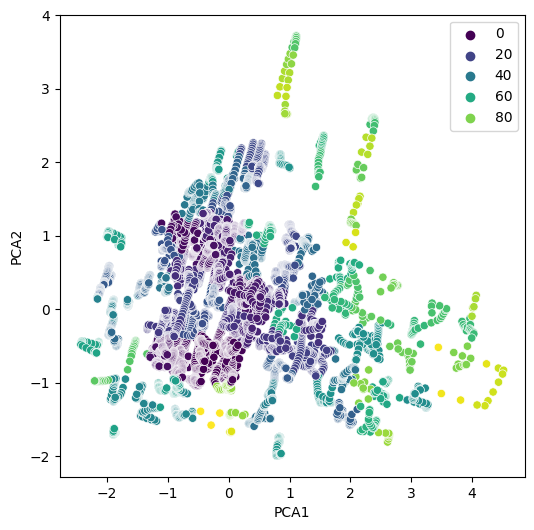

In [87]:
plot_clusters_PCA(mean_shift.labels_)

In [88]:
print(f"Silhouette Score: {silhouette_score(pca_data, mean_shift.labels_)}")

Silhouette Score: 0.43406829740454766


##### Silhouette Score

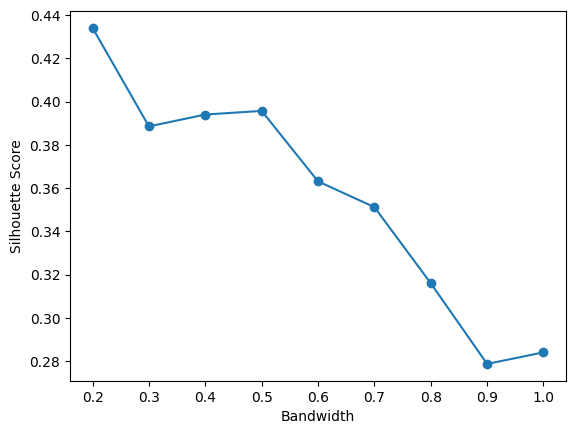

In [218]:
silhouette_scores = []
bandwidth_values = np.arange(0.2, 1.01, 0.1)

for bandwidth in bandwidth_values:
    clustering = MeanShift(bandwidth=bandwidth)
    clustering.fit(pca_data)
    score = silhouette_score(pca_data, clustering.labels_)
    silhouette_scores.append(score)

# Plotting the silhouette scores
plt.plot(bandwidth_values, silhouette_scores, marker='o')
plt.xlabel('Bandwidth')
plt.ylabel('Silhouette Score')
plt.show()

## PCA: Spectral Clustering

In [89]:
spectral = SpectralClustering(n_clusters=2, assign_labels='discretize')
spectral.fit(pca_data)

SpectralClustering(assign_labels='discretize', n_clusters=2)

In [90]:
np.unique(spectral.labels_, return_counts=True)

(array([0, 1], dtype=int64), array([5884,  536], dtype=int64))

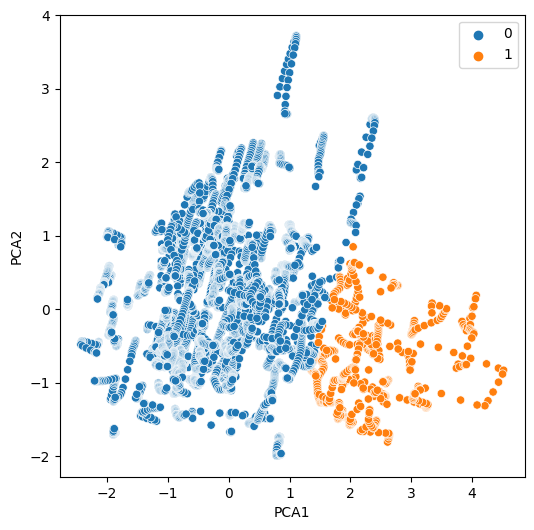

In [91]:
clusters = spectral.labels_

plt.figure(figsize=(6, 6))
sns.scatterplot(data=pca_data, x='PCA1', y='PCA2', hue=clusters)
plt.show()

In [92]:
print(f"Silhouette Score: {silhouette_score(pca_data, spectral.labels_)}")

Silhouette Score: 0.45594020430326465


##### Silhouette Score

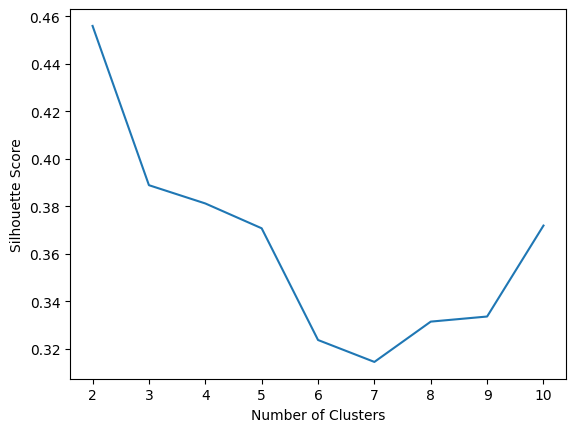

In [199]:
silhouette_coefficients = []

for k in range(2,11):
    clustering = SpectralClustering(n_clusters=k, assign_labels='discretize')
    clustering.fit(pca_data)
    score = silhouette_score(pca_data, clustering.labels_)
    silhouette_coefficients.append(score)

# Plotting Silhouette Score

plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.show()

# Silhouette Score ranges between -1 to +1
# Value more towards +1 more better clustering is

## PCA: Fuzzy c-means Clustering

In [93]:
for i in range(2,11):
    fcmeans = FCM(n_clusters=i)
    fcmeans.fit(pca_data.values)
    print(i, fcmeans.partition_coefficient)

2 0.34673737085163525
3 0.2215930564258592
4 0.14472464779233574
5 0.11019658159786484
6 0.08896881100087414
7 0.07381988185320619
8 0.06294100114935171
9 0.053553428329321355
10 0.04694079152890452


In [94]:
# partition_coefficient indicates how well-separated the clusters are from each other
# higher partition coefficient indicates better separation between clusters
# thus, we choose n_clusters=2 as it gives us the highest partition coefficient among all

fcmeans = FCM(n_clusters=2)
fcmeans.fit(pca_data.values)

In [95]:
fcm_labels = fcmeans.predict(pca_data.values)

In [96]:
np.unique(fcm_labels, return_counts=True)

(array([0, 1], dtype=int64), array([2446, 3974], dtype=int64))

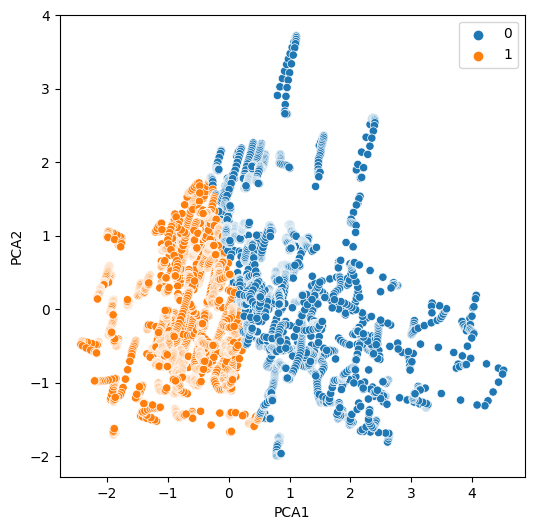

In [97]:
clusters = fcm_labels

plt.figure(figsize=(6, 6))
sns.scatterplot(data=pca_data, x='PCA1', y='PCA2', hue=clusters)
plt.show()

In [98]:
print(f"Silhouette Score: {silhouette_score(pca_data, fcm_labels)}")

Silhouette Score: 0.36378935995467526


##### Silhouette Score

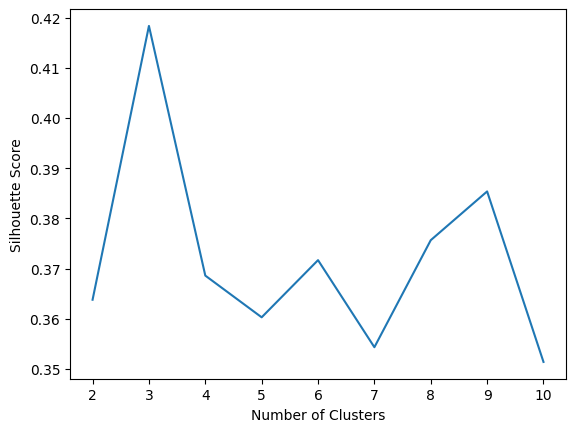

In [215]:
silhouette_coefficients = []

for k in range(2,11):
    clustering = FCM(n_clusters=k)
    clustering.fit(pca_data.values)
    clustering_labels = clustering.predict(pca_data.values)
    score = silhouette_score(pca_data.values, clustering_labels)
    silhouette_coefficients.append(score)
    
# Plotting Silhouette Score

plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.show()

# Silhouette Score ranges between -1 to +1
# Value more towards +1 more better clustering is

- After transforming the original dataset using PCA, we reduced the dimensions from 5 to 2

- The results of all the clustering algorithms on PCA transformed dataset are a bit different

- DBSCAN clustering on PCA transformed dataset gave the best silhouette score (0.48365628021466306) among all
    - But when observed carefully, the clusters are too generalized
    
- The next two highest silhouette scores were both drawn by Spectral Clustering

- Spectral Clustering gave silhouette score of 0.45594020430326465 on PCA transformed dataset and silhouette score of 0.45004975135153524 on original dataset

- Following this, Mean Shift Clustering resulted in silhouette score of 0.4340682974045484, but formed many clusters

- Comparatively, considering the silhouette score, Spectral clustering did the best among all other clustering algorithms

<br>

- We will select the results obtained by Spectral Clustering, which groups the dataset into 2 clusters

## Final Observations

*__It can be observed that <font color='blue'>cluster A</font> belongs to a share if population who <font color='blue'>suffer from Schizophrenia and Depressive disorders</font>, while <font color='red'>cluster B</font> belongs to a share if population who <font color='red'>suffer from Anxiety, Bipolar and Eating disorders</font>__*

In [100]:
spectral = SpectralClustering(n_clusters=2, assign_labels='discretize')
spectral.fit(df)

SpectralClustering(assign_labels='discretize', n_clusters=2)

In [101]:
spectral.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [102]:
np.unique(spectral.labels_, return_counts=True)

(array([0, 1], dtype=int64), array([5912,  508], dtype=int64))

In [103]:
cluster_df = pd.concat([df, pd.DataFrame(data=spectral.labels_, columns=['Cluster'])], axis=1)

In [104]:
cluster_df.head()

,Schizophrenia,Depressive,Anxiety,Bipolar,Eating,Cluster
0,0.223206,4.996118,4.713314,0.703023,0.127700,0
1,0.222454,4.989290,4.702100,0.702069,0.123256,0
2,0.221751,4.981346,4.683743,0.700792,0.118844,0
3,0.220987,4.976958,4.673549,0.700087,0.115089,0
4,0.220183,4.977782,4.670810,0.699898,0.111815,0


In [105]:
cluster_df.shape

(6420, 6)

In [106]:
X = cluster_df.drop(columns=['Cluster'], axis=1)
X

,Schizophrenia,Depressive,Anxiety,Bipolar,Eating
0,0.223206,4.996118,4.713314,0.703023,0.127700
1,0.222454,4.989290,4.702100,0.702069,0.123256
2,0.221751,4.981346,4.683743,0.700792,0.118844
3,0.220987,4.976958,4.673549,0.700087,0.115089
4,0.220183,4.977782,4.670810,0.699898,0.111815
...,...,...,...,...,...
6415,0.201042,3.407624,3.184012,0.538596,0.095652
6416,0.201319,3.410755,3.187148,0.538593,0.096662
6417,0.201639,3.411965,3.188418,0.538589,0.097330
6418,0.201976,3.406929,3.172111,0.538585,0.097909


In [107]:
y = cluster_df['Cluster']
y

0       0
1       0
2       0
3       0
4       0
       ..
6415    0
6416    0
6417    0
6418    0
6419    0
Name: Cluster, Length: 6420, dtype: int64

In [108]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

In [109]:
y_train.value_counts()

Cluster
0    4138
1     356
Name: count, dtype: int64

In [110]:
y_test.value_counts()

Cluster
0    1774
1     152
Name: count, dtype: int64

In [111]:
features = df.columns

pipeline = Pipeline(
    steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())
])

In [112]:
preprocessor = ColumnTransformer(
    transformers=[
        ('pipeline', pipeline, features),
])

In [113]:
X_train_transformed = preprocessor.fit_transform(X_train)
X_test_transformed = preprocessor.transform(X_test)

In [114]:
smenn = SMOTEENN()
X_resampled, y_resampled = smenn.fit_resample(X_train_transformed, y_train)

## Model Training

In [115]:
# Evaluate Model
def evaluate_model(true, predicted):
    conf_matrix = confusion_matrix(true, predicted)
    accuracy = accuracy_score(true, predicted)
    precision = precision_score(true, predicted)
    recall = recall_score(true, predicted)
    f1_src = f1_score(true, predicted)
    return conf_matrix, accuracy, precision, recall, f1_src

In [118]:
models = {
    "Logistic Regression": LogisticRegression(),
    "Support Vector Classifier": SVC(),
    "Gaussian NaiveBayes Classifier": GaussianNB(),
    "K Neighbors Classifier": KNeighborsClassifier(),
    "DecisionTree Classifier": DecisionTreeClassifier(),
    "RandomForest Classifier": RandomForestClassifier(),
    "AdaBoost Classifier": AdaBoostClassifier(),
    "XGB Classifier": XGBClassifier(),
}

In [119]:
params = {
    'Logistic Regression': {'penalty':['l2', 'elasticnet', None],'solver':['lbfgs','newton-cg','newton-cholesky','sag','saga']},
    'Support Vector Classifier': {'C':[0.001,0.01,0.4,0.7,1], 'kernel':['linear','poly','rbf','sigmoid'], 'gamma':['scale','auto']},
    'Gaussian NaiveBayes Classifier': {'var_smoothing': np.logspace(0,-9, num=25)},
    'K Neighbors Classifier': {'n_neighbors':[1,2,3,4,5,6,7],'weights':['uniform', 'distance'],'algorithm':['auto', 'ball_tree', 'kd_tree']},
    'DecisionTree Classifier': {'criterion': ['gini', 'entropy'],'max_depth': [3,4,5,6],'min_samples_split': [2,4,6,8,10]},
    'RandomForest Classifier': {'n_estimators':[10,25,50,100],'criterion':['gini', 'entropy', 'log_loss'],'max_depth':[3,4,5,6]},
    'AdaBoost Classifier': {'n_estimators':[10,25,50,100], 'learning_rate':[0.001,0.01,0.1,0.5,1], 'algorithm':['SAMME','SAMME.R']},
    'XGB Classifier': {'learning_rate': [0.01, 0.1, 0.2],'max_depth': [3,4,5,6],'n_estimators': [10,25,50,100]},
}

In [120]:
model_list = []
score = []

In [121]:
for i in range(len(list(models))):
    
    print(list(models.keys())[i])
    model = list(models.values())[i]

    # Hyperparameter Tuning
    grid_clf = GridSearchCV(model,params[list(models.keys())[i]],cv=3)
    grid_clf.fit(X_resampled, y_resampled)
    
    # Train the model
    model.set_params(**grid_clf.best_params_)
    model.fit(X_resampled, y_resampled)
    
    # Make predictions
    y_pred = model.predict(X_test_transformed)
    
    # Evaluate Test dataset
    conf_matrix, accuracy, precision, recall, f1_src = evaluate_model(y_test, y_pred)
    
    # Update Model list
    model_list.append(list(models.keys())[i])
    
    # Update Accuracy list
    score.append(accuracy)

    # Display results
    print('Model performance for Test set')
    print("- Confusion Matrix:\n{}".format(conf_matrix))
    print("- Accuracy: {:.4f}".format(accuracy))
    print("- Precision: {:.4f}".format(precision))
    print("- Recall: {:.4f}".format(recall))
    print("- F1-Score: {:.4f}".format(f1_src))

    print('='*40)
    print('\n')

Logistic Regression
Model performance for Test set
- Confusion Matrix:
[[1758   16]
 [   0  152]]
- Accuracy: 0.9917
- Precision: 0.9048
- Recall: 1.0000
- F1-Score: 0.9500


Support Vector Classifier
Model performance for Test set
- Confusion Matrix:
[[1765    9]
 [   1  151]]
- Accuracy: 0.9948
- Precision: 0.9437
- Recall: 0.9934
- F1-Score: 0.9679


Gaussian NaiveBayes Classifier
Model performance for Test set
- Confusion Matrix:
[[1644  130]
 [   0  152]]
- Accuracy: 0.9325
- Precision: 0.5390
- Recall: 1.0000
- F1-Score: 0.7005


K Neighbors Classifier
Model performance for Test set
- Confusion Matrix:
[[1770    4]
 [   2  150]]
- Accuracy: 0.9969
- Precision: 0.9740
- Recall: 0.9868
- F1-Score: 0.9804


DecisionTree Classifier
Model performance for Test set
- Confusion Matrix:
[[1772    2]
 [   0  152]]
- Accuracy: 0.9990
- Precision: 0.9870
- Recall: 1.0000
- F1-Score: 0.9935


RandomForest Classifier
Model performance for Test set
- Confusion Matrix:
[[1772    2]
 [   0  152]]

In [122]:
pd.DataFrame(list(zip(model_list, score)), columns=['Model Name', 'Accuracy']).sort_values(by=["Accuracy"],ascending=False)

,Model Name,Accuracy
4,DecisionTree Classifier,0.998962
5,RandomForest Classifier,0.998962
7,XGB Classifier,0.998962
6,AdaBoost Classifier,0.998442
3,K Neighbors Classifier,0.996885
1,Support Vector Classifier,0.994808
0,Logistic Regression,0.991693
2,Gaussian NaiveBayes Classifier,0.932503
